# Sports Equipment Recognizer
The goal of this project is to classify 20 different types of sports equipment popular around the world. The types are following: <br/>

1.  Soccer ball
2.  Basketball ball
3.  Tennis Racket
4.  Baseball Bat
5.  Cricket Bat
6.  Hockey Stick
7.  Volleyball ball
8.  Badminton Shuttlecock
9.  Table Tennis Paddle
10.  Rugby Ball
11. Golf ball
12. Bowling Ball
13. Skateboard
14. Ski Poles
15. Ice Skates
16. Frisbee disc
17. Carrom board
18. Archery Bow
19. Boxing Gloves
20. Chessboard

# Setting Up Necessary Things

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
bs = 32 # batch size
version = 3

In [ ]:
!pip install -Uqq fastai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 234.5/234.5 kB 12.0 MB/s eta 0:00:00


In [ ]:
from fastai import *
from fastai.vision.all import *
from fastai.vision.widgets import *

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/Sports Equipment

/content/drive/My Drive/Sports Equipment


# Fetch Data

In [ ]:
data_path = "data"
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,                        # get_image_files returns a list of all images in that path recursively by default
    splitter=RandomSplitter(valid_pct=0.1, seed=42),  # getting 90-10 train-validation split
    get_y=parent_label,                               # taking the folder name as labels
    item_tfms=Resize(128))                            # resizing to get the image of same shape

In [ ]:
dblock = dblock.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path, bs = bs)
torch.save(dls, f"dataloaders/sport_dataloader_v{version}.pkl")

In [ ]:
dls = torch.load(f"dataloaders/sport_dataloader_v{version}.pkl")

<ipython-input-7-071782abce6b>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  dls = torch.load(f"dataloaders/sport_dataloader_v{version}.pkl")


In [ ]:
dls.train.vocab

['Archery Bow', 'Badminton Shuttlecock', 'Baseball Bat', 'Basketball ball', 'Bowling Ball', 'Boxing Gloves', 'Carrom board', 'Chessboard', 'Cricket Bat', 'Frisbee disc', 'Golf ball', 'Hockey Stick', 'Ice Skates', 'Rugby Ball', 'Skateboard', 'Ski Poles', 'Soccer ball', 'Table Tennis Paddle', 'Tennis Racket', 'Volleyball ball']

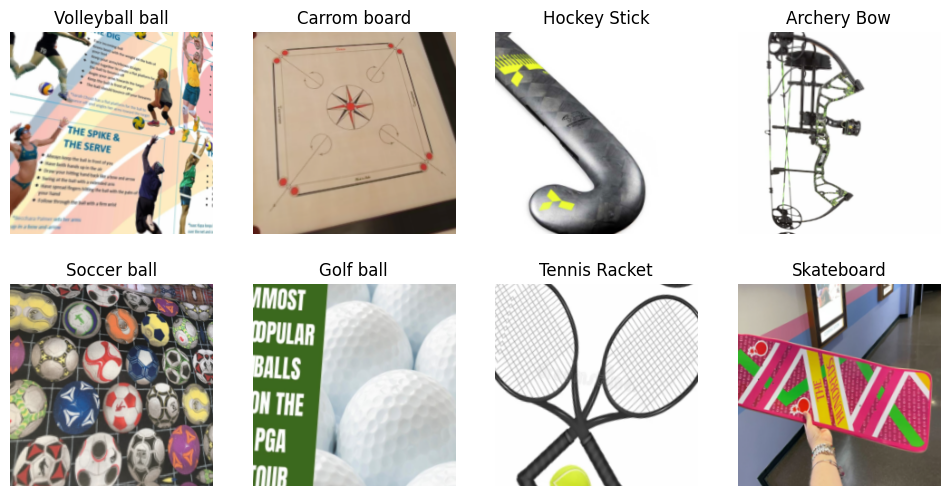

In [ ]:
dls.train.show_batch(max_n=8, nrows=2)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


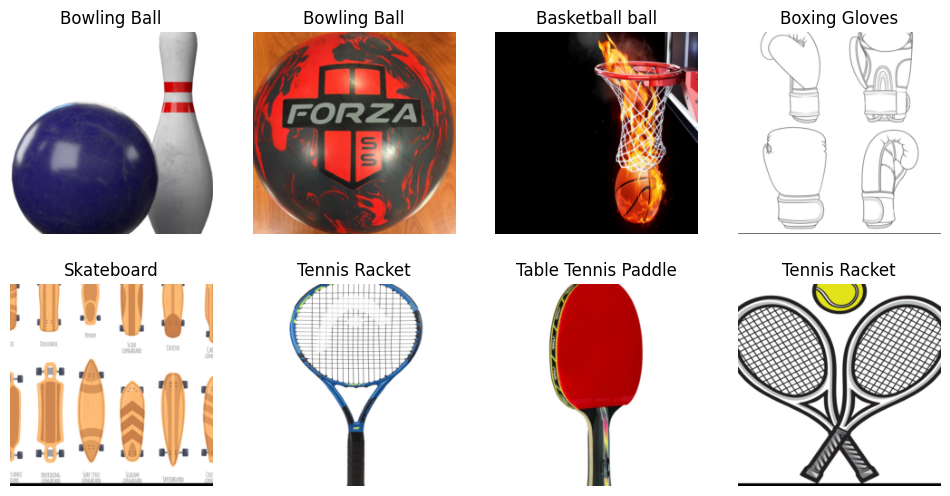

In [ ]:
dls.valid.show_batch(max_n=8, nrows=2)

# Training and Data Cleaning

In [ ]:
model_path = "models"

In [ ]:
model = vision_learner(dls, resnet34, metrics=[error_rate,accuracy])

In [ ]:
model.load(f"sport-recognizer-v{version-1}")

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

In [ ]:
model.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.128638,0.033528,0.006289,0.993711,03:10


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.174682,0.100035,0.029350,0.970650,03:08
1,0.217329,0.074056,0.025157,0.974843,03:07
2,0.115498,0.071633,0.025157,0.974843,03:11


In [ ]:
# model.fine_tune(1)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.279307,0.147781,0.049689,0.950311,03:19


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.347096,0.178722,0.053830,0.946170,03:18


In [ ]:
model.save(f"sport-recognizer-v{version}")

Path('models/sport-recognizer-v3.pth')

In [ ]:
# model.load(f"sport-recognizer-v{version}")

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

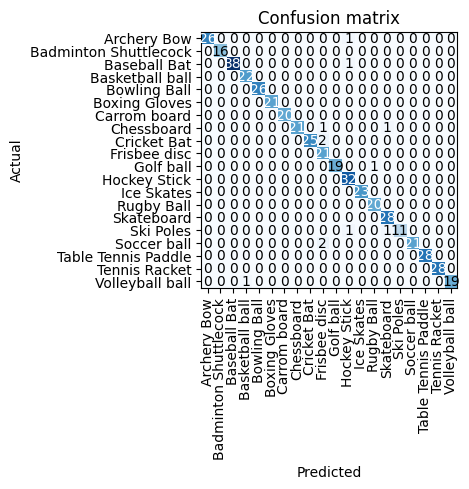

In [ ]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

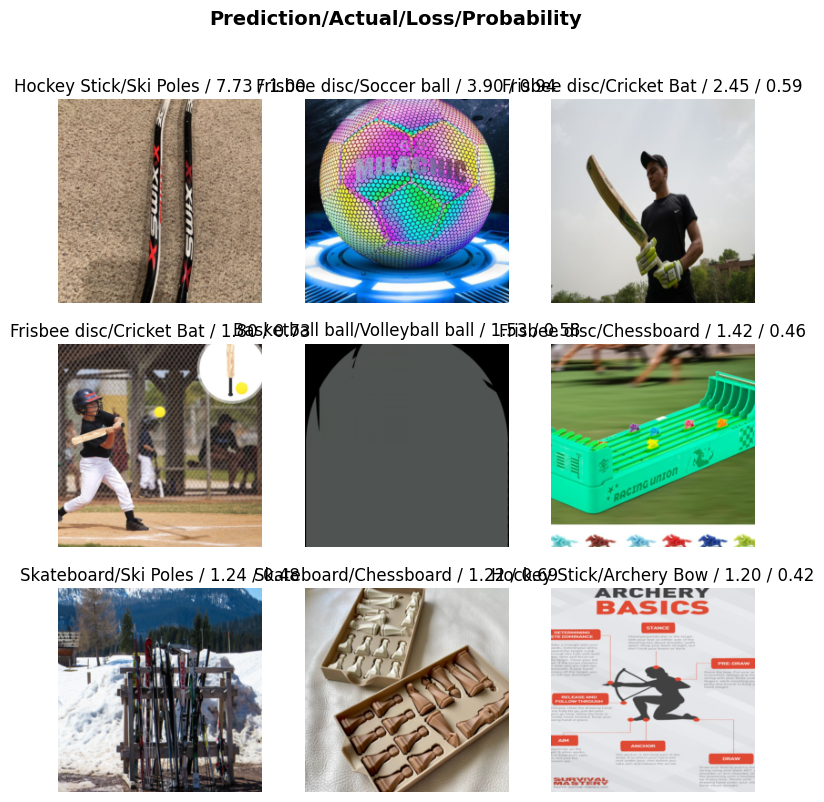

In [ ]:
interp.plot_top_losses(9, nrows=3)

In [ ]:
cleaner = ImageClassifierCleaner(model)
cleaner
# cricket,tennis, volley, ski

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()                                    # delete irrelevant data
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), f"{data_path}/{cat}") # change the directory

# Export model for inference

In [ ]:
model.export(f"{model_path}/sport-recognizer-v{version}.pkl")